In [410]:
import numpy as np
import math
import matplotlib.pyplot as plt
import cv2
from sklearn import mixture
from sklearn.metrics import confusion_matrix
from helpers import ImageManager
from skimage.feature import local_binary_pattern

In [411]:
np.random.seed(7)

In [412]:
# Get Data using the Helper Class
mng = ImageManager()
training = dict()
testing = dict()
testing["images"] = mng.get_testing_images()
training["images"] = mng.get_training_images()
_, testing["bounds"] = mng.update_testing_bounds()
_, training["bounds"] = mng.update_training_bounds()

In [413]:
K = 15

In [414]:
def sift_feats(imgs_dict, K, draw = False, clf=None):
  
    images = imgs_dict["images"]
    bounds = imgs_dict["bounds"]
    
    num_imgs_per_person = int(len(images)/5)

    sift_feats = []

    if(draw):
        plt.figure(figsize=(20, 70))
    
    for i, img in enumerate(images):

        img_disp = img.copy()

        # create a SIFT object
        sift = cv2.xfeatures2d.SIFT_create()

        # detect SIFT features, with no masks
        keypoints = sift.detect(img, None)

        keypoints_filtered = []
        for kp in keypoints:
            point = kp.pt;
            if(point[0] > bounds[i]["min_x"] and 
               point[0] < bounds[i]["max_x"] and 
               point[1] > bounds[i]["min_y"] and 
               point[1] < bounds[i]["max_y"]):
                keypoints_filtered.append(kp)

        keypoints = keypoints_filtered

        # compute SIFT descriptors
        keypoints, descriptors = sift.compute(img, keypoints)

        feats_dict = {"keypoints": keypoints, "descriptors" : descriptors}

        sift_feats.append(feats_dict)

        # draw the keypoints
        cv2.drawKeypoints(img, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        if(draw):
            # display images
            plt.subplot(num_imgs_per_person, 5, (math.floor(i/num_imgs_per_person) + 1 + 5 * (i % num_imgs_per_person)))
            plt.imshow(img_disp)

    
    plt.show()
    
    return sift_feats, clf

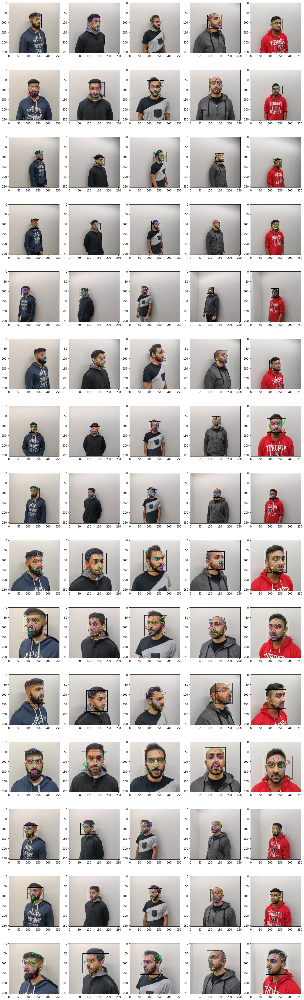

In [415]:
training["sift"], gmm_clf = sift_feats(training, K, draw = True)

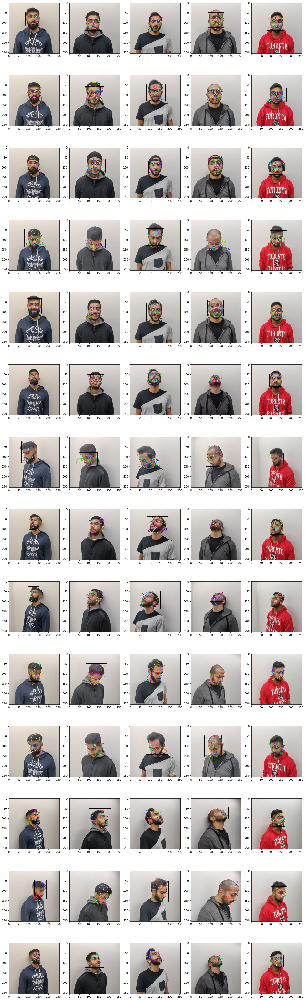

In [416]:
testing["sift"], _ = sift_feats(testing, K, draw = True, clf=gmm_clf)

In [417]:
def difference(hist_1, hist_2):
    hist_1 = np.array(hist_1)
    hist_2= np.array(hist_2)
    diff = np.linalg.norm(hist_1 - hist_2)
    return diff

In [418]:
def hog_features(images, cell_size=3, block_size=2, nbins=9):
    """
    Finds hog features for a list of images
    """
    features = []
    
    for img in images:
        w = img.shape[0]
        h = img.shape[1]
        h_cells = h // cell_size
        w_cells = w // cell_size
        n_cells = (w_cells, h_cells)
        
        # create HoG Object
        hog = cv2.HOGDescriptor(_winSize=(h_cells * cell_size, w_cells * cell_size),
                                _blockSize=(block_size * cell_size, block_size * cell_size),
                                _blockStride=(cell_size, cell_size),
                                _cellSize=(cell_size, cell_size),
                                _nbins=nbins)

        # Compute HoG features
        hog_feats = hog.compute(img).reshape(h_cells - block_size + 1,
                                             w_cells - block_size + 1,
                                             block_size, block_size,
                                             nbins).transpose((1, 0, 3, 2, 4))
        hog_feats = hog_feats.flatten()
        features.append(hog_feats)
        
    return np.array(features)

In [419]:
def get_identities(histogram_test, histogram_train):
    identities = []
    for j, _h_test in enumerate(histogram_test):
        closest_idx = 0
        min_diff = 1000
        diff = 0
        for i, _h_train in enumerate(histogram_train):
            diff = difference(_h_train, _h_test)
            if(diff < min_diff):
                min_diff = diff
                closest_idx = i

        if(closest_idx >= 0 and closest_idx < 15):
            identities.append("Abdullah")
        elif(closest_idx >= 15 and closest_idx < 30):
            identities.append("Mustafa")
        elif(closest_idx >= 30 and closest_idx < 45):
            identities.append("Saleh")
        elif(closest_idx >= 45 and closest_idx < 60):
            identities.append("Adham")
        else:
            identities.append("Anees")
    return identities

In [420]:
def calculate_recog_rate(identities):
    ids = ["Abdullah", "Mustafa", "Saleh", "Adham", "Anees"]

    true_ids = []
    for ID in ids:
        for i in range(14):
            true_ids.append(ID)

    correct = 0
    for i in range(70):
        correct += identities[i] == true_ids[i]
    
    rate = correct/70*100
    
    print('Recoginition Rate: {:.3f}%'.format(rate))
    return rate, true_ids

In [421]:
def BoW(cell_size_list, k, clf=None):
    fit_list = []
    hog_patches = []
    for person in cell_size_list:
        for image in person:
            fit_list.append(image)
            for patch_hog in image:
                hog_patches.append(patch_hog)
    fit_list = np.array(fit_list)   

    if clf is None:
        clf = mixture.GaussianMixture(n_components = K, covariance_type='tied', random_state=7)
        # fit GMM on train data
        clf.fit(hog_patches);
    
    # predict cluster membership from the fitted GMM 
    labels = []
    for img in fit_list:
        labels.append(clf.predict(img))
    
    histograms = []
    for _label in labels:
        freq = []
        for _k in range(k):
            freq.append(np.count_nonzero(_label == _k))
        histograms.append(freq/np.linalg.norm(freq))
    
    # Plot
    plt.figure(figsize=(20, 5))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        plt.bar(range(K), histograms[i], edgecolor='k' )
        plt.xlim([-1, K]) # set x-axis limit
    plt.show()
    
    return histograms, clf

In [422]:
def get_features(training, testing, train_dict, test_dict, extractor='HOG', patch_size=15):
    """
    NOT BEING USED YET
    """
    for size in train_dict.keys():
        imgs_test = []
        imgs_train = []
        for j in range(int(len(training['images'])/15)):  # 5
            feats_per_person = []

            for i in range(15 * j, (15 * j) + 15):
                img = training['images'][i]

                # Extract 15x15 around each keypoint
                img_crop_train = []
                for kp in training['sift'][i]["keypoints"]:
                    min_y = int(kp.pt[1] - patch_size//2)
                    max_y = int(kp.pt[1] + patch_size//2)
                    min_x = int(kp.pt[0] - patch_size//2)
                    max_x = int(kp.pt[0] + patch_size//2)

                    img_crop_train.append(cv2.cvtColor(img[min_y:max_y, min_x:max_x], cv2.COLOR_RGB2GRAY))
                if extractor == 'HOG':
                    feats_per_img = (hog_features(np.array(img_crop_train),cell_size=size))
                elif extractor == 'LBP':
                    feats_per_img = lbp_features(np.array(img_crop_train),size)
                feats_per_img = feats_per_img.reshape(len(feats_per_img),-1)
                feats_per_person.append(feats_per_img)

            imgs_train.append(feats_per_person)


        # Get Testing Images KP + HoG feats
        for j in range(int(len(testing['images'])/14)):  # 5

            feats_per_person = []

            for i in range((14 * j), (14 * j) + 14):
                img = testing['images'][i]

                # Extract 15x15 around each keypoint
                img_crop_test = []
                for kp in testing['sift'][i]["keypoints"]:
                    min_y = int(kp.pt[1] - patch_size//2)
                    max_y = int(kp.pt[1] + patch_size//2)
                    min_x = int(kp.pt[0] - patch_size//2)
                    max_x = int(kp.pt[0] + patch_size//2)

                    img_crop_test.append(cv2.cvtColor(img[min_y:max_y, min_x:max_x], cv2.COLOR_RGB2GRAY))

                if extractor == 'HOG':
                    feats_per_img = (hog_features(np.array(img_crop_test),cell_size=size))
                elif extractor == 'LBP':
                    feats_per_img = lbp_features(np.array(img_crop_test),size)
                    
                feats_per_img = feats_per_img.reshape(len(feats_per_img),-1)
                feats_per_person.append(feats_per_img)

            imgs_test.append(feats_per_person)

        test_dict[size] = imgs_test
        train_dict[size] = imgs_train


## 4.3 Experiment 1: HoG

In [423]:
cell_sizes_train = {3: None, 4:None, 5:None}
cell_sizes_test = {3: None, 4: None, 5: None}

get_features(training, testing, cell_sizes_train, cell_sizes_test, 'HOG', 15)

### Cell Size = 3x3

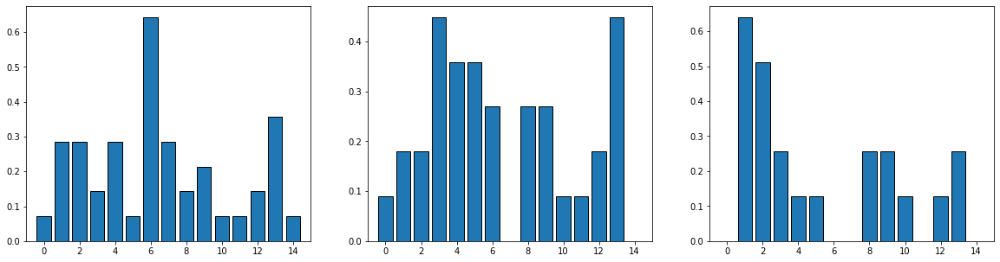

In [424]:
h_train, gmm_clf = BoW(cell_sizes_train[3], K, None)

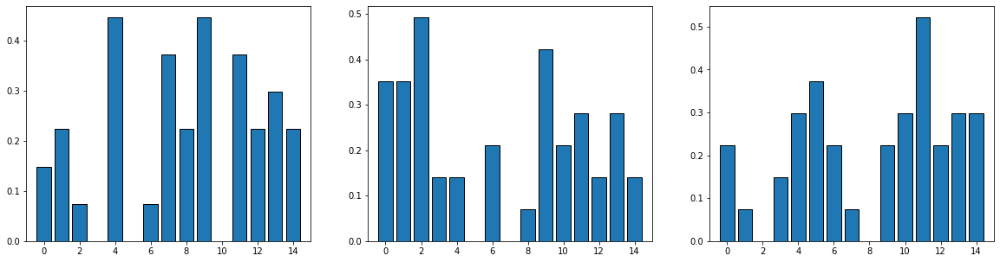

In [425]:
h_test, _ = BoW(cell_sizes_test[3], K, gmm_clf)

In [426]:
identities3 = get_identities(h_test, h_train)

In [427]:
rate_3, true_ids3 = calculate_recog_rate(identities3)

Recoginition Rate: 21.429%


### Cell Size = 4x4

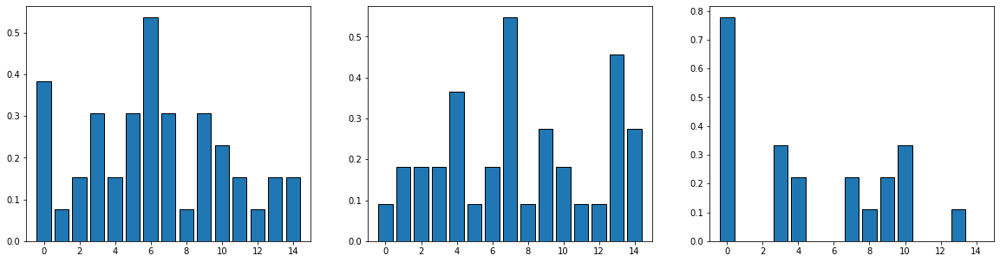

In [428]:
h_train, gmm_clf = BoW(cell_sizes_train[4], K, None)

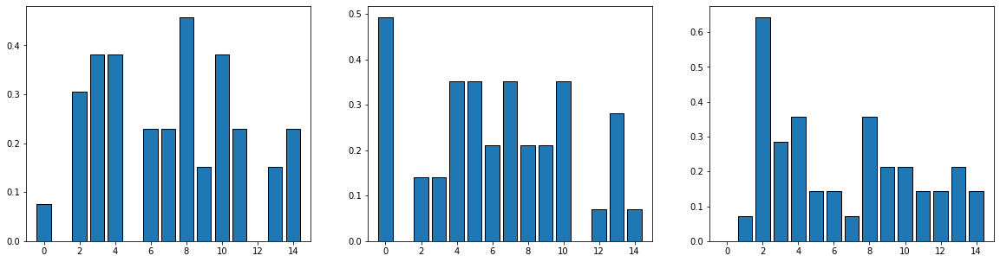

In [429]:
h_test, _ = BoW(cell_sizes_test[4], K, gmm_clf)

In [430]:
identities4 = get_identities(h_test, h_train)

In [431]:
rate_4, true_ids4 = calculate_recog_rate(identities4)

Recoginition Rate: 24.286%


### Cell Size = 5x5

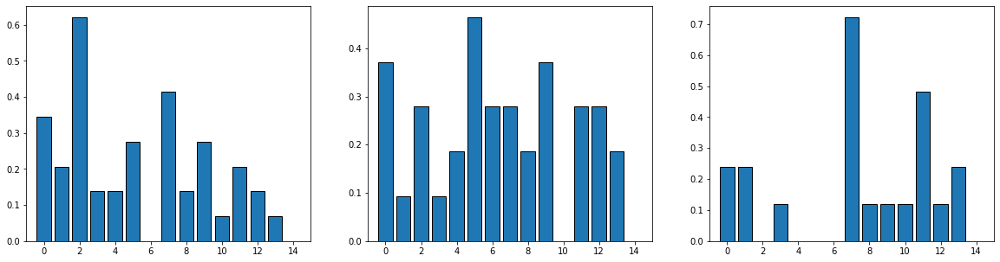

In [432]:
h_train, gmm_clf = BoW(cell_sizes_train[5], K, None)

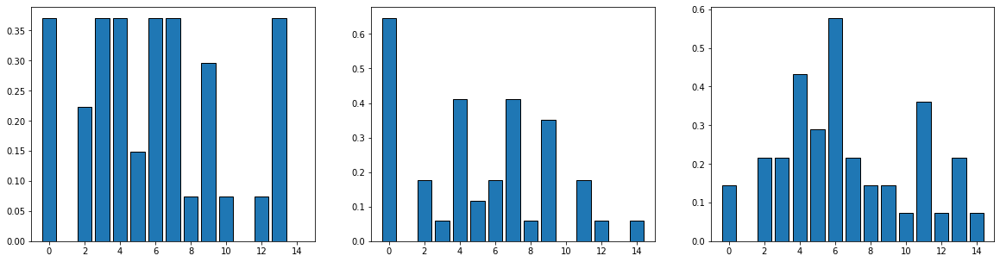

In [433]:
h_test, _ = BoW(cell_sizes_test[5], K, gmm_clf)

In [434]:
identities5 = get_identities(h_test, h_train)

In [435]:
rate_5, true_ids5 = calculate_recog_rate(identities5)

Recoginition Rate: 25.714%


### Plot recognition rate (on y-axis) vs patch size (on x-axis). Compute confusion matrix for the best performing vocabulary.

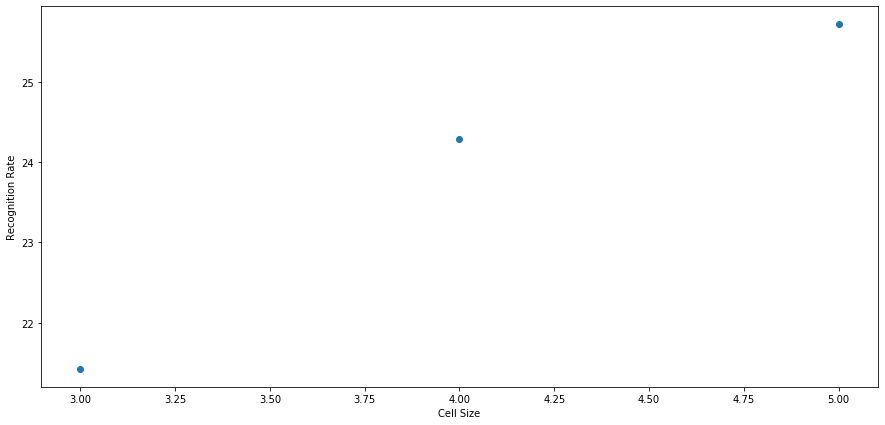

In [436]:
plt.figure(figsize=(15,7))
plt.scatter([3,4,5], [rate_3, rate_4, rate_5])
plt.ylabel('Recognition Rate')
plt.xlabel('Cell Size')
plt.show()

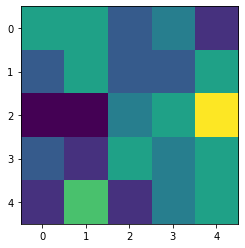

In [437]:
rates = [rate_3, rate_4, rate_5]
index = np.argmax(rates)
y_test = [true_ids3, true_ids4, true_ids5]
y_pred = [identities3, identities4, identities5]
plt.imshow(confusion_matrix(y_test[index], y_pred[index]))
plt.show()

## 4.1 Experiment 1: LBP

In [438]:
def lbp_features(images, radius):
    """
    Finds hog features for a list of images
    """
    features = []
    
    for img in images:
        
        lbp = local_binary_pattern(img, 8*radius, radius)
        lbp = lbp.flatten()
        features.append(lbp)
        
    return np.array(features)

In [439]:
"""
4.3 Experiment 1

Crop images after extracting sift keypoints then LBP of new cropped img

"""

radii_train = {2: None, 7:None, 12:None}
radii_test = {2: None, 7: None, 12: None}

get_features(training, testing, radii_train, radii_test, 'LBP', 15)

### Radius = 2

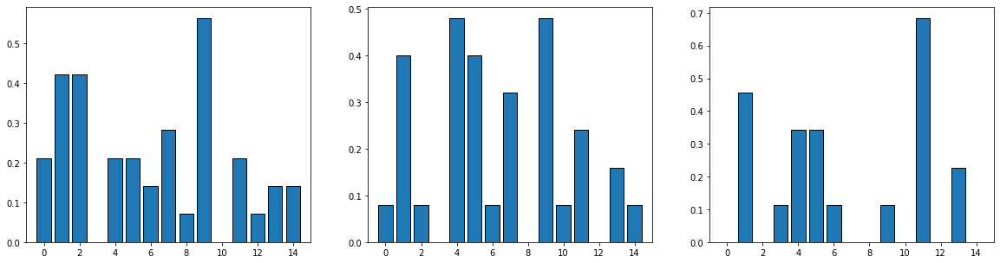

In [440]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

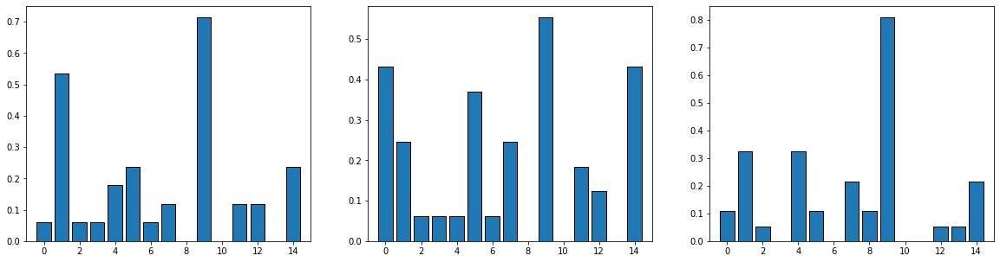

In [441]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [442]:
identities2 = get_identities(h_test, h_train)

In [443]:
rate_2, true_ids2 = calculate_recog_rate(identities2)

Recoginition Rate: 21.429%


### Radius = 7

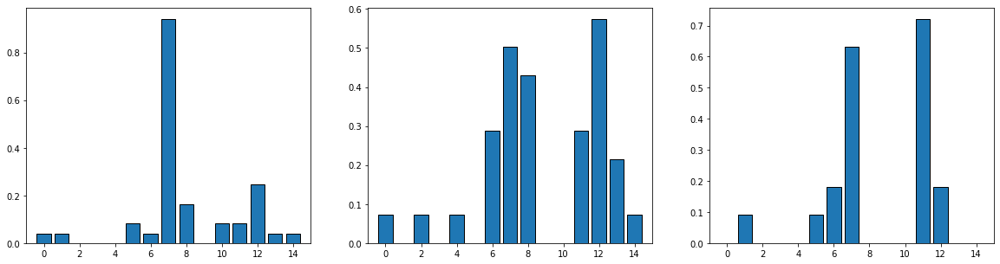

In [444]:
h_train, gmm_clf = BoW(radii_train[7], K, None)

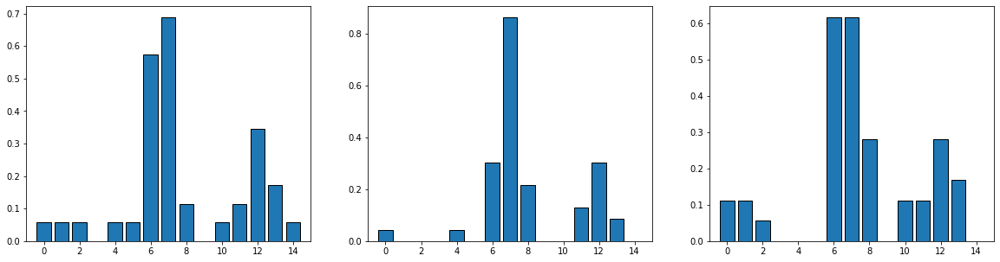

In [445]:
h_test, _ = BoW(radii_test[7], K, gmm_clf)

In [446]:
identities7 = get_identities(h_test, h_train)

In [447]:
rate_7, true_ids7 = calculate_recog_rate(identities7)

Recoginition Rate: 31.429%


### Radius = 12

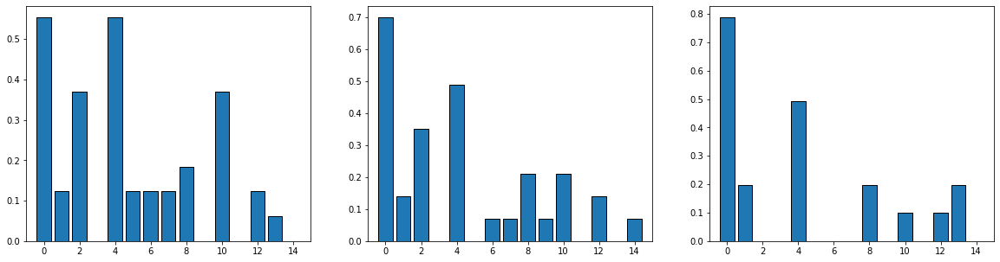

In [448]:
h_train, gmm_clf = BoW(radii_train[12], K, None)

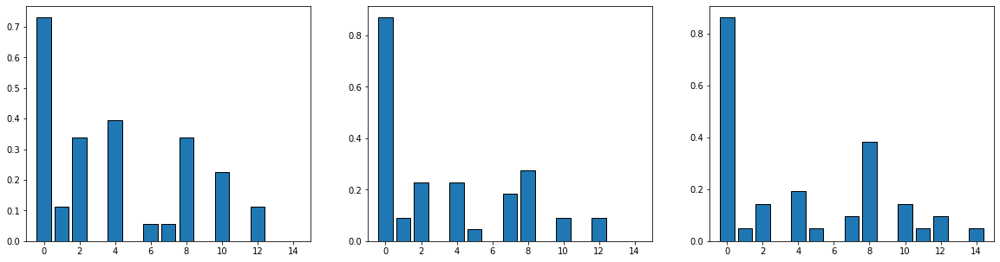

In [449]:
h_test, _ = BoW(radii_test[12], K, gmm_clf)

In [450]:
identities12 = get_identities(h_test, h_train)

In [451]:
rate_12, true_ids12 = calculate_recog_rate(identities12)

Recoginition Rate: 24.286%


### Plot recognition rate (on y-axis) vs patch size (on x-axis). Compute confusion matrix for the best performing vocabulary.

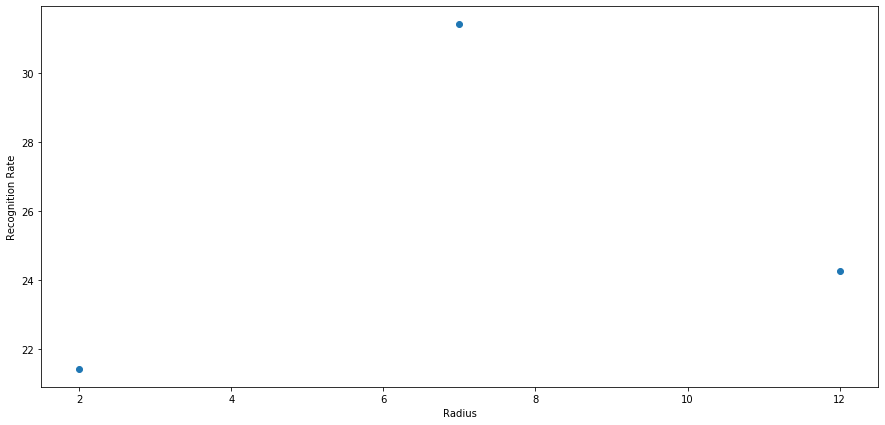

In [452]:
plt.figure(figsize=(15,7))
plt.scatter([2,7,12], [rate_2, rate_7, rate_12])
plt.ylabel('Recognition Rate')
plt.xlabel('Radius')
plt.show()

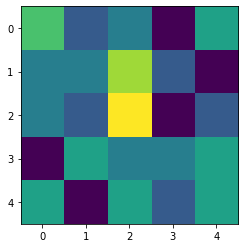

In [453]:
rates = [rate_2, rate_7, rate_12]
index = np.argmax(rates)
y_test = [true_ids2, true_ids7, true_ids12]
y_pred = [identities2, identities7, identities12]
plt.imshow(confusion_matrix(y_test[index], y_pred[index]))
plt.show()

# 4.3 Experiment 2: Patch Sizes

Best performing was LBP with radius=2 at 38.5% Recognition rate

## patch_size = 5x5

In [454]:
radii_train = {2: None}
radii_test = {2: None}
get_features(training, testing, radii_train, radii_test, 'LBP', patch_size=5)

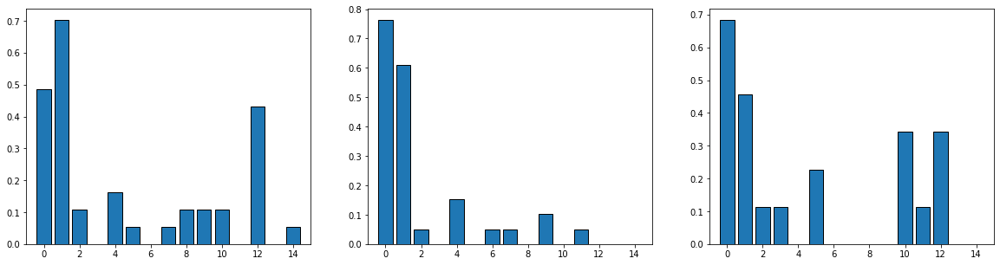

In [455]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

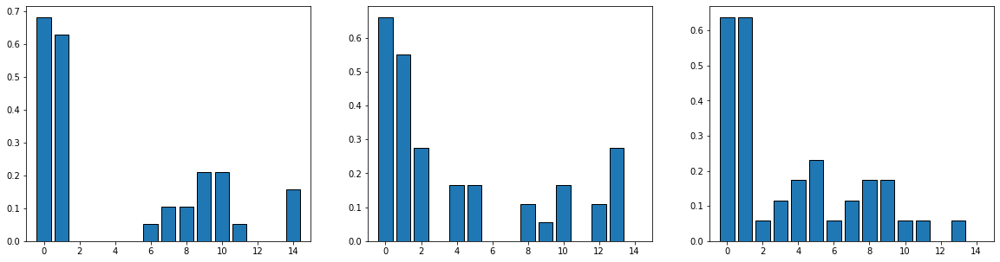

In [456]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [457]:
identities_patch5 = get_identities(h_test, h_train)

In [458]:
rate_patch5, true_ids_patch5 = calculate_recog_rate(identities_patch5)

Recoginition Rate: 20.000%


## patch_size = 15x15

In [459]:
radii_train = {2: None}
radii_test = {2: None}
get_features(training, testing, radii_train, radii_test, 'LBP', patch_size=15)

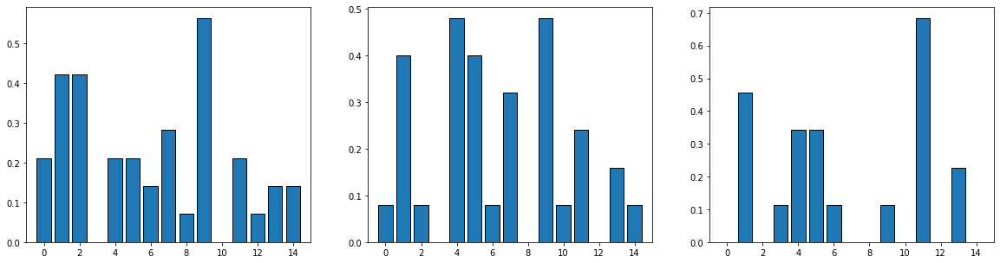

In [460]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

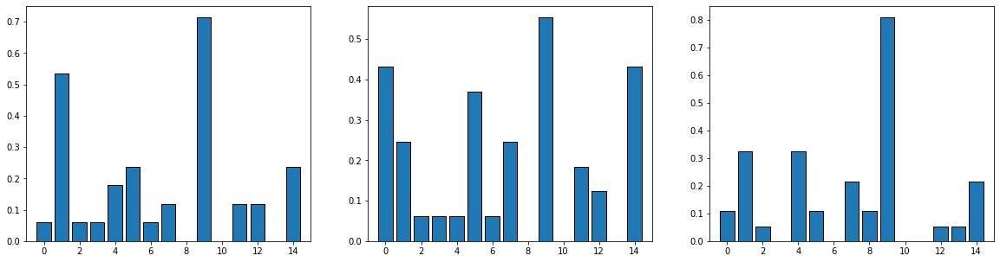

In [461]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [462]:
identities_patch15 = get_identities(h_test, h_train)

In [463]:
rate_patch15, true_ids_patch15 = calculate_recog_rate(identities_patch15)

Recoginition Rate: 21.429%


### patch_size = 25x25

In [464]:
radii_train = {2: None}
radii_test = {2: None}
get_features(training, testing, radii_train, radii_test, 'LBP', patch_size=25)

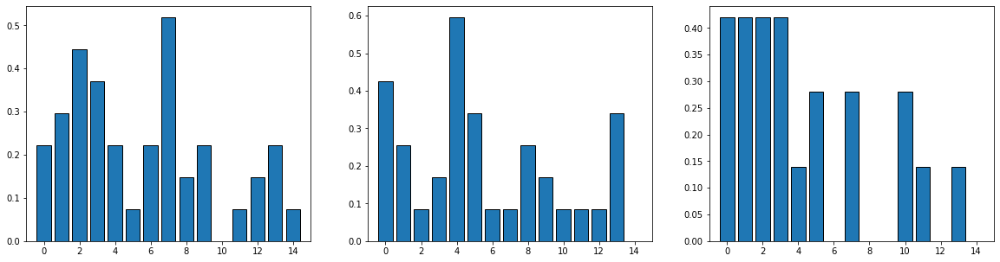

In [465]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

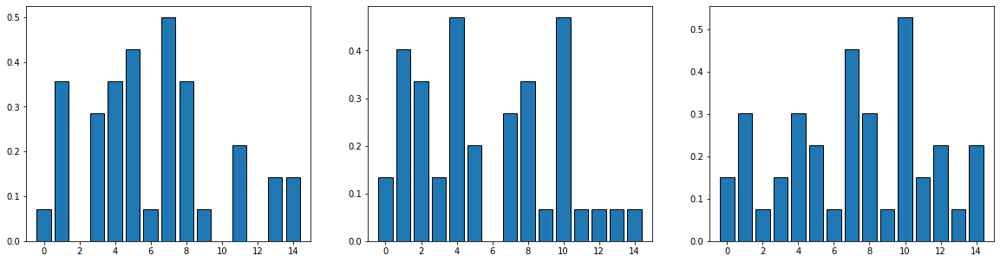

In [466]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [467]:
identities_patch25 = get_identities(h_test, h_train)

In [468]:
rate_patch25, true_ids_patch25 = calculate_recog_rate(identities_patch25)

Recoginition Rate: 30.000%


### Plot recognition rate (on y-axis) vs patch size (on x-axis). Compute confusion matrix for the best performing vocabulary.

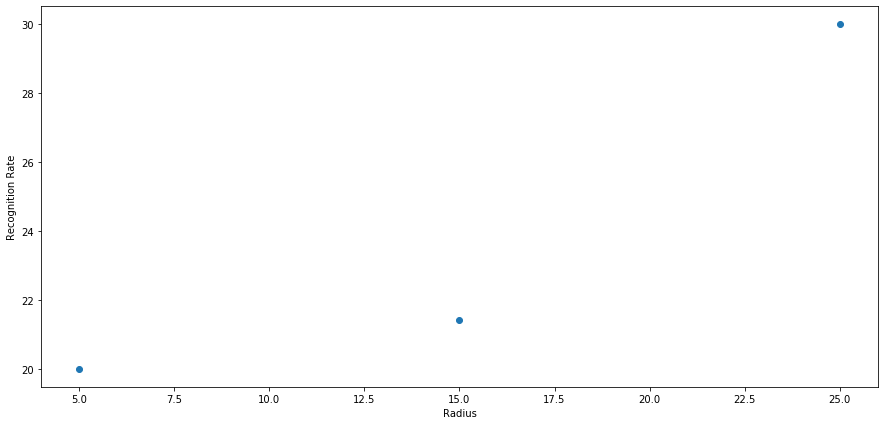

In [469]:
plt.figure(figsize=(15,7))
plt.scatter([5,15,25], [rate_patch5, rate_patch15, rate_patch25])
plt.ylabel('Recognition Rate')
plt.xlabel('Radius')
plt.show()

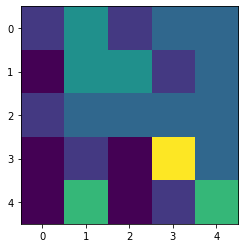

In [470]:
rates = [rate_patch5, rate_patch15, rate_patch25]
index = np.argmax(rates)
y_test = [true_ids_patch5, true_ids_patch15, true_ids_patch25]
y_pred = [identities_patch5, identities_patch15, identities_patch25]
plt.imshow(confusion_matrix(y_test[index], y_pred[index]))
plt.show()

In [474]:
def corner_feats(imgs_dict, draw = True):
  
    images = imgs_dict["images"]
    bounds = imgs_dict["bounds"]
    
    num_imgs_per_person = int(len(images)/5)

    corner_pts = []

    if(draw):
        plt.figure(figsize=(20, 70))
    
    for i, img in enumerate(images):

        img_disp = img.copy()
        
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # cv2.cornerHarris(src, neighborhoodsize, sobelKernelSize, Harris_k)
        corners = cv2.cornerHarris(img_gray, 2, 7, 0.00005)
            
        cv2.normalize(corners, corners, 0, 1, cv2.NORM_MINMAX)

        # threshold for an optimal value
        thres = 0.1
        
        loc = np.where(corners >= thres)
            
        corners_filtered = []
        for pt in zip(*loc[::-1]):
            point = pt;
            if(point[0] > bounds[i]["min_x"] + 3 and 
               point[0] < bounds[i]["max_x"] - 3 and 
               point[1] > bounds[i]["min_y"] + 3 and 
               point[1] < bounds[i]["max_y"] - 3):
                corners_filtered.append(point)
                cv2.drawMarker(img_disp, pt, (255,0,0), markerType = cv2.MARKER_CROSS, markerSize = 2, thickness = 2)

        corner_pts.append(corners_filtered)
        
        if(draw):
            # display images
            plt.subplot(num_imgs_per_person, 5, (math.floor(i/num_imgs_per_person) + 1 + 5 * (i % num_imgs_per_person)))
            plt.imshow(img_disp)

    
    plt.show()
    
    return corner_pts


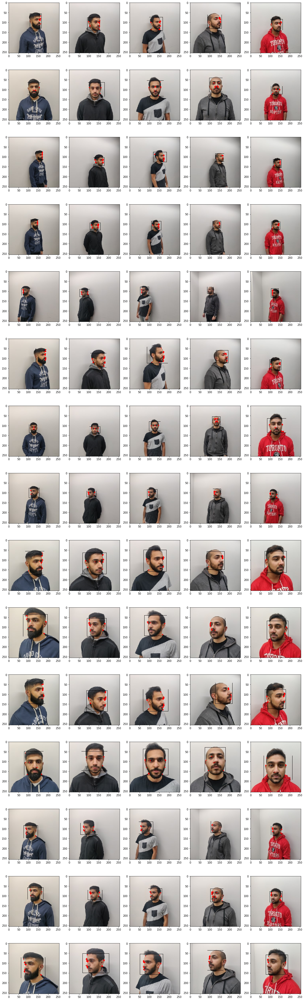

[[(161, 68), (161, 69), (159, 71), (160, 80), (159, 81), (160, 81), (161, 81), (160, 82), (161, 82), (160, 83), (161, 83), (161, 84), (153, 86), (154, 86), (153, 87), (154, 87), (154, 88), (157, 89), (158, 89), (159, 89), (160, 89), (157, 90), (158, 90), (159, 90), (157, 91), (158, 91), (159, 91), (158, 92), (159, 92), (161, 108), (161, 109)], [(155, 88), (155, 89), (125, 103), (134, 103), (135, 103), (136, 103), (125, 104), (135, 104), (136, 104), (136, 106), (137, 106)], [(171, 77), (171, 78), (171, 79), (171, 80), (169, 81), (170, 81), (171, 81), (169, 82), (170, 82), (171, 82), (169, 83), (170, 83), (171, 87), (171, 88), (171, 89), (171, 90), (168, 91), (170, 91), (171, 91), (168, 92), (170, 92), (171, 92), (170, 93), (171, 93), (169, 100), (170, 100), (171, 100), (169, 101), (170, 101), (171, 101), (171, 109), (171, 110)], [(146, 85), (146, 86), (147, 86), (146, 87), (147, 91), (147, 92), (147, 93), (143, 96), (144, 96), (146, 96), (147, 96), (144, 97), (146, 97), (147, 97), (146,

In [476]:
training['harris corners'] = corner_feats(training)
print(training['harris corners'][0])